In [1]:
import numpy as np 
import pandas as pd 
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import os

In [2]:
from typing import Optional, Dict, List
import tensorflow as tf
import os

In [3]:
DATA_DIR = "/data/images/"

In [4]:
#current folder path
IMAGE_PATH = os.getcwd() + DATA_DIR

In [5]:
class ImagePot:
    # parsed from abbreviations.csv
    CLASSNAME_LOOKUP = {
        'ABE': 'Abnormal eosinophil',
        'ART': 'Artefact',
        'BAS': 'Basophil',
        'BLA': 'Blast',
        'EBO': 'Erythroblast',
        'EOS': 'Eosinophil',
        'FGC': 'Faggott cell',
        'HAC': 'Hairy cell',
        'KSC': 'Smudge cell',
        'LYI': 'Immature lymphocyte',
        'LYT': 'Lymphocyte',
        'MMZ': 'Metamyelocyte',
        'MON': 'Monocyte',
        'MYB': 'Myelocyte',
        'NGB': 'Band neutrophil',
        'NGS': 'Segmented neutrophil',
        'NIF': 'Not identifiable',
        'OTH': 'Other cell',
        'PEB': 'Proerythroblast',
        'PLM': 'Plasma cell',
        'PMO': 'Promyelocyte',
    }
    
    def __init__(self, image_paths: List[str], classname: str, encoding: Optional[List[int]] = None):
        self.image_paths = image_paths
        self.classname = classname
        self.encoding = encoding
        self.full_name = self.CLASSNAME_LOOKUP.get(classname, "?")

    def set_encoding(self, encoding) -> None:
        self.encoding = encoding

    def __str__(self) -> str:
        return "Image Pot containing Class {0} ({1}), {2} file(s)".format(
            self.classname, 
            self.full_name,
            len(self.image_paths),
        )

    def __repr__(self) -> str:
        return str(self)

In [6]:
def load_images(
        num_image_minimum: int = 100, 
        num_image_limit: Optional[int] = 200,
        print_files_on_disk: bool = False,
    ) -> Dict[str, Dict[str, object]]: 

    # these are the labels enclosing each folder of images
    sub_dirs = sorted([y for x in os.walk(IMAGE_PATH) if (y := (x[0].split(IMAGE_PATH)[-1]))])

    # assume that data processing script has already un-nested image contents
    good_folders = {}

    for folder in sub_dirs:
        file_names = os.listdir("/".join([IMAGE_PATH, folder]))
        num_images = len(file_names)
        if print_files_on_disk:
            print(f"Classname: {folder} has {num_images} images.")

        if num_images >= num_image_minimum:
            good_folders[folder] = {
                'pot': ImagePot([IMAGE_PATH + folder + "/" + x for x in file_names[:num_image_limit]], folder), 
                'classname': folder,
                'ohe': None,
            }
            
    # directory of valid images
    ohe_classes = [([0] * len(good_folders)) for _ in range(len(good_folders))]
    for i, k in enumerate(good_folders):
        encoding = ohe_classes[i]
        # set equal to available classes
        encoding[i] = 1
        good_folders[k]['pot'].set_encoding(encoding)

        # simplify repo structure
        good_folders[k] = good_folders[k]['pot']

    return good_folders

In [7]:
data_repo = load_images()

In [8]:
data_repo

{'ART': Image Pot containing Class ART (Artefact), 200 file(s),
 'BAS': Image Pot containing Class BAS (Basophil), 200 file(s),
 'BLA': Image Pot containing Class BLA (Blast), 200 file(s),
 'EBO': Image Pot containing Class EBO (Erythroblast), 200 file(s),
 'EOS': Image Pot containing Class EOS (Eosinophil), 200 file(s),
 'HAC': Image Pot containing Class HAC (Hairy cell), 200 file(s),
 'LYT': Image Pot containing Class LYT (Lymphocyte), 200 file(s),
 'MMZ': Image Pot containing Class MMZ (Metamyelocyte), 200 file(s),
 'MON': Image Pot containing Class MON (Monocyte), 200 file(s),
 'MYB': Image Pot containing Class MYB (Myelocyte), 200 file(s),
 'NGB': Image Pot containing Class NGB (Band neutrophil), 200 file(s),
 'NGS': Image Pot containing Class NGS (Segmented neutrophil), 200 file(s),
 'NIF': Image Pot containing Class NIF (Not identifiable), 200 file(s),
 'OTH': Image Pot containing Class OTH (Other cell), 200 file(s),
 'PEB': Image Pot containing Class PEB (Proerythroblast), 200 

### Visualizing Pathology Samples

Going to use the following resource to see if we can mess with the distribution of RGB values.

https://matplotlib.org/stable/tutorials/introductory/images.html

In [9]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

In [10]:
folder_list = list(data_repo.keys())
image_pot_list = []
def image_pots(data_repo, folder_list):
    for i in folder_list:
        image_pot_list.append((str(i)+'_image_pot'))
    return image_pot_list

In [11]:
#function to get a list of images from the pathology folder
def get_images(image_pot):
    image_list = []
    for i in range(len(art_image_pot.image_paths)):
        image_list.append(cv2.imread(image_pot.image_paths[i]))
        
    return image_list

In [12]:
#pulling 10 random samples for visualization
def rand_img(image_list):
    sample_images = []
    num_list = random.sample(range(0, 200), 7)
    for i in num_list:
        sample_images.append(image_list[i])
    return sample_images, num_list

Below I was attempting to make functions which would take in a list of the different folders and produce sample images and their labels for visualization. However, I haven't been able to make it work yet so I have done each folder individually.

In [13]:
# folder_list = list(data_repo.keys())
# image_pot_list = []
# def image_pots(data_repo, folder_list):
#     for i in folder_list:
#         image_pot_list.append((str(i)+'_image_pot'))
#     return image_pot_list

# complete_path = image_pots(data_repo, folder_list)
# complete_path

#function to get a list of images from the pathology folder

# def get_images1(image_pot):
#     for j in image_pot:
#         name = j[:3]+'_image_pot'
#         rename_list.append(name)
#     return rename_list

# def get_images2(image_pot):
#     for j in image_pot:    
#         for i in range(len(image_pot)):
#             image_list.append(cv2.imread(image_pot.image_paths[i]))
        
#     return image_list

# complete_images = get_images2(complete_path)
# complete_images

# #pulling 10 random samples for visualization
# def rand_img(image_list):
#     sample_images = []
#         num_list = random.sample(range(0, 200), 7)
#         for i in num_list:
#             sample_images.append(image_list[i])
#         return sample_images, num_list

#### ART

In [14]:
art_image_pot = data_repo['ART']
ART_images = get_images(art_image_pot)
ART_sample_images, ART_sample_indices = rand_img(ART_images)

#### BAS

In [15]:
BAS_image_pot = data_repo['BAS']
BAS_images = get_images(BAS_image_pot)
BAS_sample_images, BAS_sample_indices = rand_img(BAS_images)

#### BLA

In [16]:
BLA_image_pot = data_repo['BLA']
BLA_images = get_images(BLA_image_pot)
BLA_sample_images, BLA_sample_indices = rand_img(BLA_images)

#### EBO

In [17]:
EBO_image_pot = data_repo['EBO']
EBO_images = get_images(EBO_image_pot)
EBO_sample_images, EBO_sample_indices = rand_img(EBO_images)

#### EOS

In [18]:
EOS_image_pot = data_repo['EOS']
EOS_images = get_images(EOS_image_pot)
EOS_sample_images, EOS_sample_indices = rand_img(EOS_images)

#### HAC

In [19]:
HAC_image_pot = data_repo['HAC']
HAC_images = get_images(HAC_image_pot)
HAC_sample_images, HAC_sample_indices = rand_img(HAC_images)

#### LYT

In [20]:
LYT_image_pot = data_repo['LYT']
LYT_images = get_images(LYT_image_pot)
LYT_sample_images, LYT_sample_indices = rand_img(LYT_images)

#### MMZ

In [21]:
MMZ_image_pot = data_repo['MMZ']
MMZ_images = get_images(MMZ_image_pot)
MMZ_sample_images, MMZ_sample_indices = rand_img(MMZ_images)

#### MON

In [22]:
MON_image_pot = data_repo['MON']
MON_images = get_images(MON_image_pot)
MON_sample_images, MON_sample_indices = rand_img(MON_images)

#### MYB

In [23]:
MYB_image_pot = data_repo['MYB']
MYB_images = get_images(MYB_image_pot)
MYB_sample_images, MYB_sample_indices = rand_img(MYB_images)

#### NGB

In [24]:
NGB_image_pot = data_repo['NGB']
NGB_images = get_images(NGB_image_pot)
NGB_sample_images, NGB_sample_indices = rand_img(NGB_images)

#### NGS

In [25]:
NGS_image_pot = data_repo['NGS']
NGS_images = get_images(NGS_image_pot)
NGS_sample_images, NGS_sample_indices = rand_img(NGS_images)

#### NIF

In [26]:
NIF_image_pot = data_repo['NIF']
NIF_images = get_images(NIF_image_pot)
NIF_sample_images, NIF_sample_indices = rand_img(NIF_images)

#### OTH

In [27]:
OTH_image_pot = data_repo['OTH']
OTH_images = get_images(OTH_image_pot)
OTH_sample_images, OTH_sample_indices = rand_img(OTH_images)

#### PEB

In [28]:
PEB_image_pot = data_repo['PEB']
PEB_images = get_images(PEB_image_pot)
PEB_sample_images, PEB_sample_indices = rand_img(PEB_images)

#### PLM

In [29]:
PLM_image_pot = data_repo['PLM']
PLM_images = get_images(PLM_image_pot)
PLM_sample_images, PLM_sample_indices = rand_img(PLM_images)

#### PMO

In [30]:
PMO_image_pot = data_repo['PMO']
PMO_images = get_images(PMO_image_pot)
PMO_sample_images, PMO_sample_indices = rand_img(PMO_images)

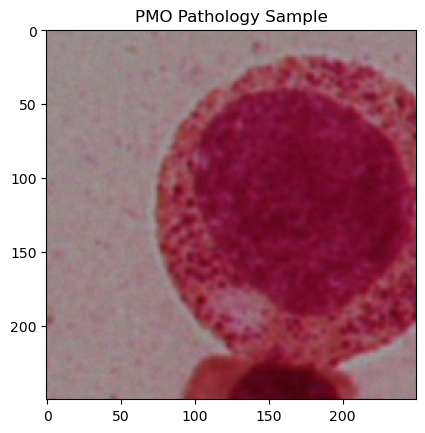

In [31]:
#testing an image
img = PMO_sample_images[3]

plt.title('PMO Pathology Sample')
imgplot = plt.imshow(img)

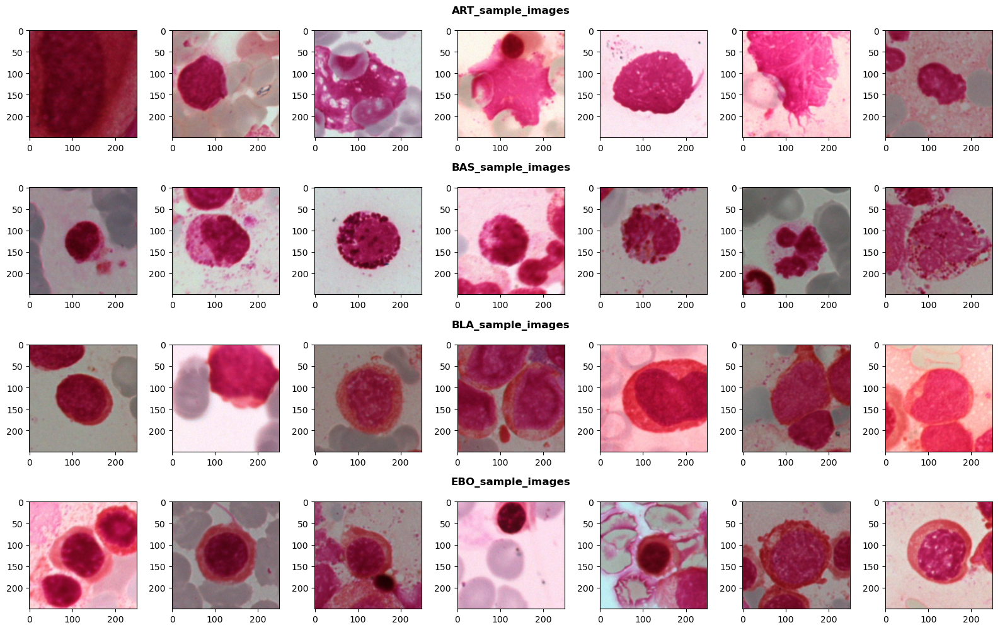

In [32]:
#visualizing 7 samples of the first 4 pathogens
import matplotlib as mpl
from matplotlib.gridspec import SubplotSpec

def create_subtitle(fig: plt.Figure, grid: SubplotSpec, title: str):
    "Sign sets of subplots with title"
    row = fig.add_subplot(grid)
    # the '\n' is important
    row.set_title(f'{title}\n', fontweight='semibold')
    # hide subplot
    row.set_frame_on(False)
    row.axis('off')

fig, axs = plt.subplots(4, 7)
fig.set_size_inches(16, 10)

for i in range(7):
    axs[0][i].imshow(ART_sample_images[i])
    axs[1][i].imshow(BAS_sample_images[i])
    axs[2][i].imshow(BLA_sample_images[i])
    axs[3][i].imshow(EBO_sample_images[i])

rows = 4
cols = 7
grid = plt.GridSpec(rows, cols)
create_subtitle(fig, grid[0, ::], 'ART_sample_images')
create_subtitle(fig, grid[1, ::], 'BAS_sample_images')
create_subtitle(fig, grid[2, ::], 'BLA_sample_images')
create_subtitle(fig, grid[3, ::], 'EBO_sample_images')

plt.tight_layout(h_pad=2)

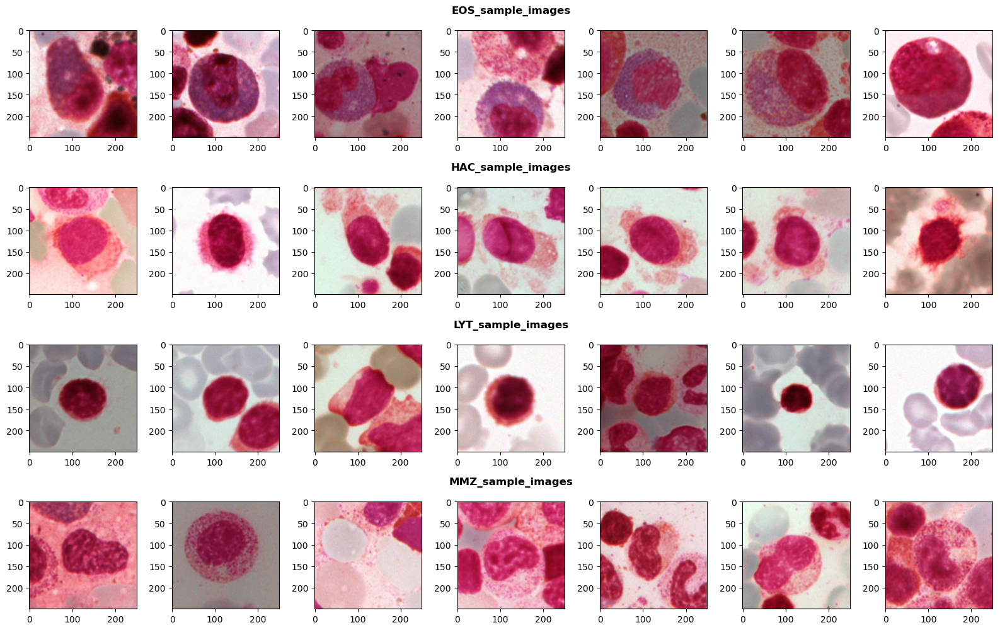

In [33]:
#visualizing the next 4 pathogens
fig, axs = plt.subplots(4, 7)
fig.set_size_inches(16, 10)

for i in range(7):
    axs[0][i].imshow(EOS_sample_images[i])
    axs[1][i].imshow(HAC_sample_images[i])
    axs[2][i].imshow(LYT_sample_images[i])
    axs[3][i].imshow(MMZ_sample_images[i])
    
rows = 4
cols = 7
grid = plt.GridSpec(rows, cols)
create_subtitle(fig, grid[0, ::], 'EOS_sample_images')
create_subtitle(fig, grid[1, ::], 'HAC_sample_images')
create_subtitle(fig, grid[2, ::], 'LYT_sample_images')
create_subtitle(fig, grid[3, ::], 'MMZ_sample_images')

plt.tight_layout(h_pad=2)

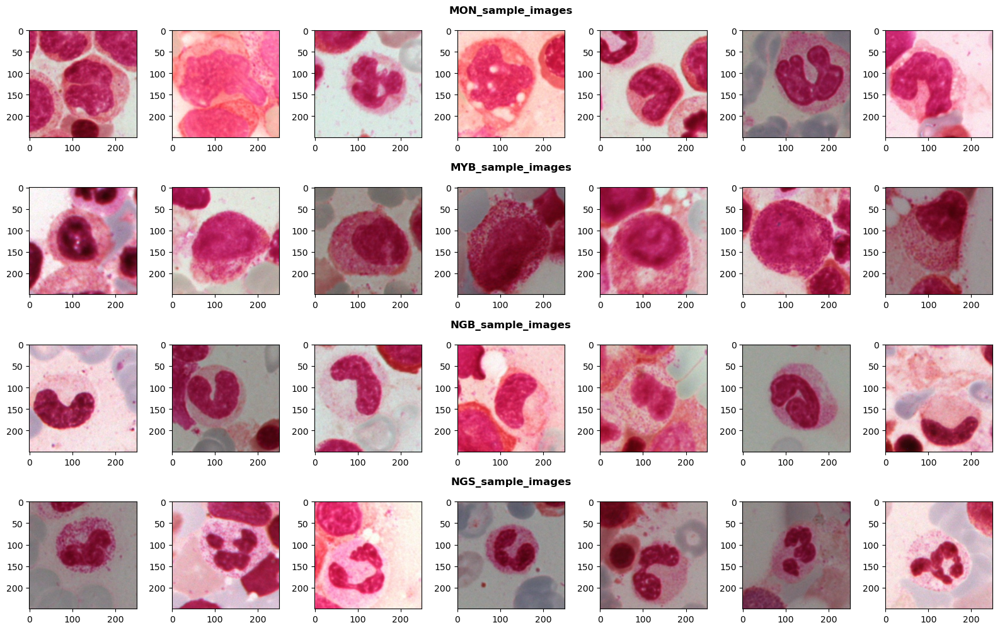

In [34]:
#visualizing the next 4 pathogens
fig, axs = plt.subplots(4, 7)
fig.set_size_inches(16, 10)

for i in range(7):
    axs[0][i].imshow(MON_sample_images[i])
    axs[1][i].imshow(MYB_sample_images[i])
    axs[2][i].imshow(NGB_sample_images[i])
    axs[3][i].imshow(NGS_sample_images[i])
    
rows = 4
cols = 7
grid = plt.GridSpec(rows, cols)
create_subtitle(fig, grid[0, ::], 'MON_sample_images')
create_subtitle(fig, grid[1, ::], 'MYB_sample_images')
create_subtitle(fig, grid[2, ::], 'NGB_sample_images')
create_subtitle(fig, grid[3, ::], 'NGS_sample_images')

plt.tight_layout(h_pad=2)

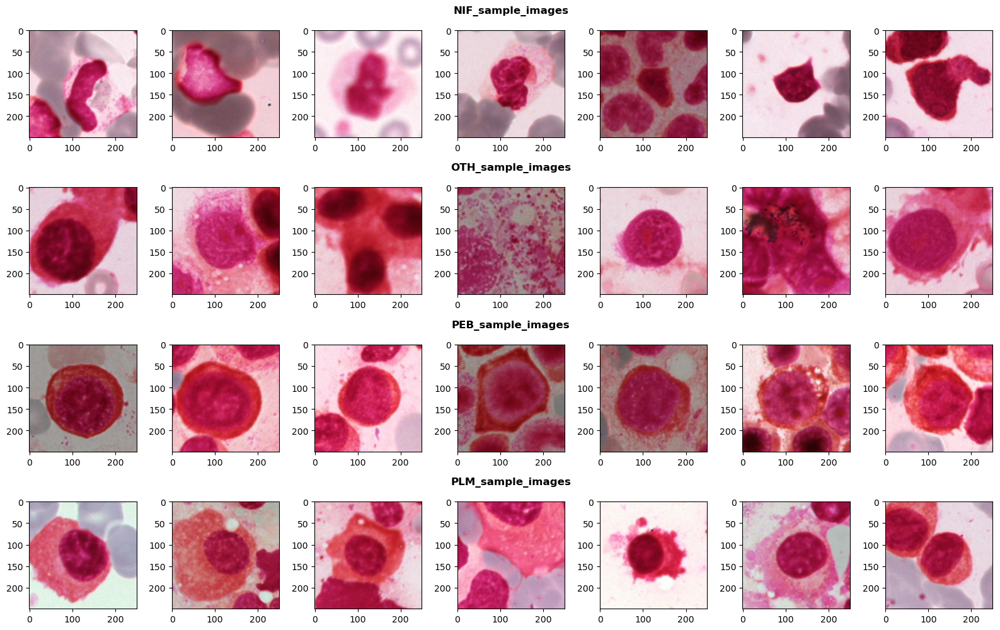

In [35]:
#visualizing the next 4 pathogens
fig, axs = plt.subplots(4, 7)
fig.set_size_inches(16, 10)

for i in range(7):
    axs[0][i].imshow(NIF_sample_images[i])
    axs[1][i].imshow(OTH_sample_images[i])
    axs[2][i].imshow(PEB_sample_images[i])
    axs[3][i].imshow(PLM_sample_images[i])

rows = 4
cols = 7
grid = plt.GridSpec(rows, cols)
create_subtitle(fig, grid[0, ::], 'NIF_sample_images')
create_subtitle(fig, grid[1, ::], 'OTH_sample_images')
create_subtitle(fig, grid[2, ::], 'PEB_sample_images')
create_subtitle(fig, grid[3, ::], 'PLM_sample_images')

plt.tight_layout(h_pad=2)

We can see by visualizing samples from each pathology that there are a lot of similarities between the differing pathologies to the naked eye, so I want to apply some pseudocolor schemes to see if we can enhance the contrast between the images.

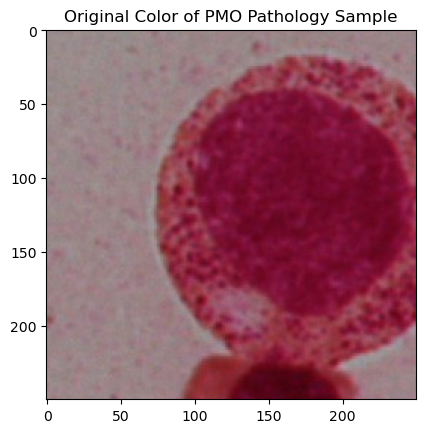

In [36]:
#testing color enhancement on our test image
# img = PMO_sample_images[3]
cmap = plt.cm.viridis
lum_img = img#[:,:,0]

fig.set_size_inches(8, 5)
plt.title('Original Color of PMO Pathology Sample')
imgplot = plt.imshow(lum_img)

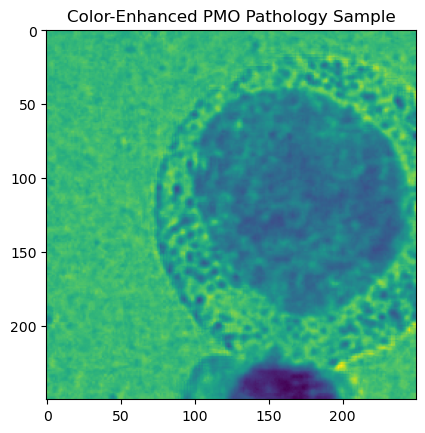

In [37]:
#testing color enhancement on our test image
# img = PMO_sample_images[3]
cmap = plt.cm.viridis
lum_img = img[:,:,0]

fig.set_size_inches(8, 5)
plt.title('Color-Enhanced PMO Pathology Sample')
imgplot = plt.imshow(lum_img)

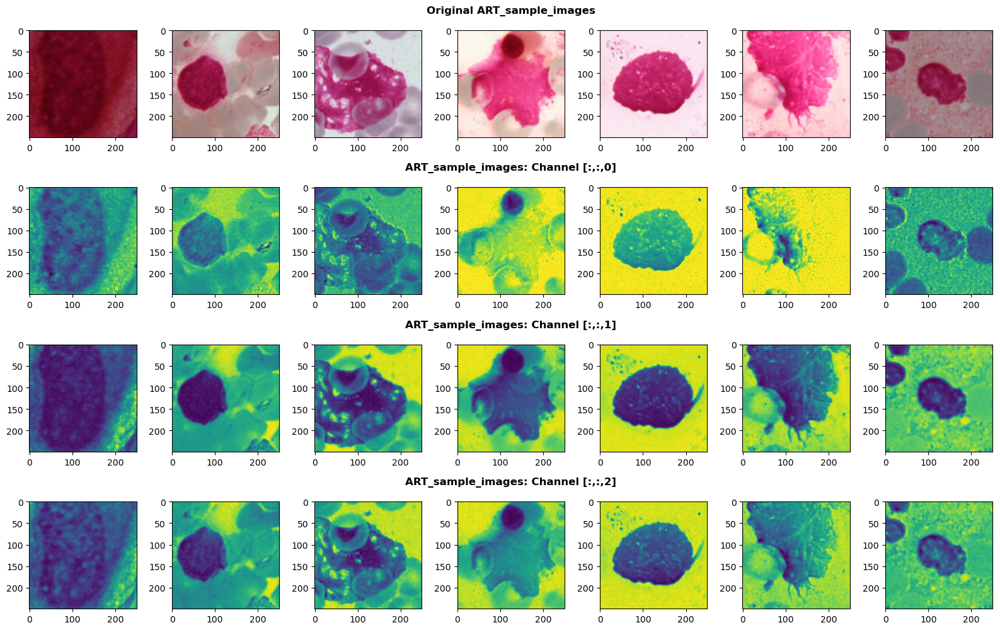

In [38]:
#ART sample images: original images compared to manipulated RGB channels
fig, axs = plt.subplots(4, 7)
fig.set_size_inches(16, 10)

for i in range(7):
    axs[0][i].imshow(ART_sample_images[i]) #original
    axs[1][i].imshow(ART_sample_images[i][:,:,0])
    axs[2][i].imshow(ART_sample_images[i][:,:,1])
    axs[3][i].imshow(ART_sample_images[i][:,:,2])
    

create_subtitle(fig, grid[0, ::], 'Original ART_sample_images')
create_subtitle(fig, grid[1, ::], 'ART_sample_images: Channel [:,:,0]')
create_subtitle(fig, grid[2, ::], 'ART_sample_images: Channel [:,:,1]')
create_subtitle(fig, grid[3, ::], 'ART_sample_images: Channel [:,:,2]')

plt.tight_layout(h_pad=2)

<Figure size 640x480 with 0 Axes>

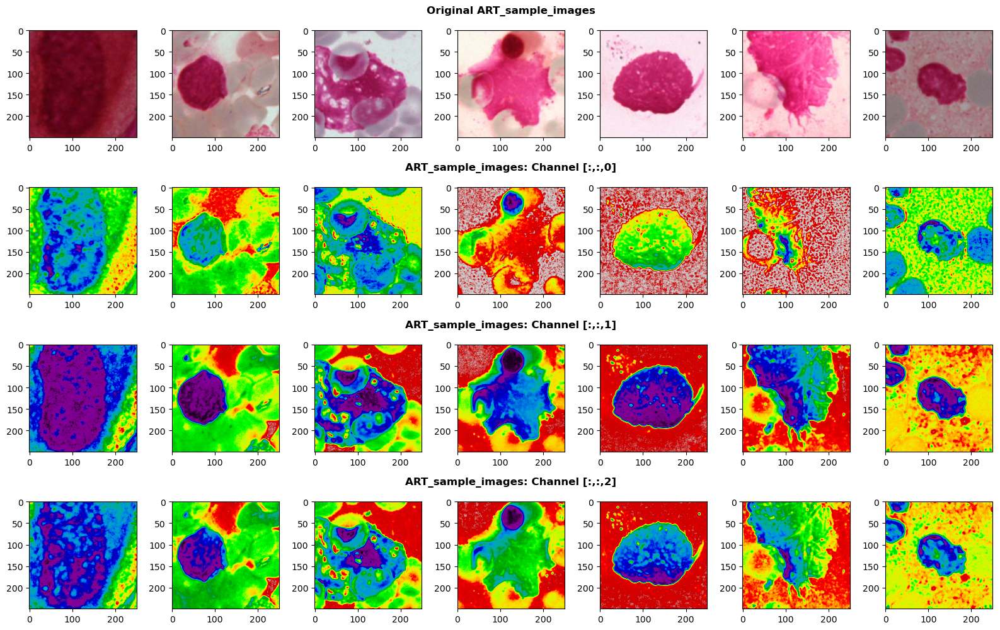

In [39]:
#ART sample images: original images compared to manipulated RGB channels
cmap = plt.cm.viridis
plt.set_cmap('nipy_spectral')

fig, axs = plt.subplots(4, 7)
fig.set_size_inches(16, 10)

for i in range(7):
    axs[0][i].imshow(ART_sample_images[i]) #original
    axs[1][i].imshow(ART_sample_images[i][:,:,0])
    axs[2][i].imshow(ART_sample_images[i][:,:,1])
    axs[3][i].imshow(ART_sample_images[i][:,:,2])
    

create_subtitle(fig, grid[0, ::], 'Original ART_sample_images')
create_subtitle(fig, grid[1, ::], 'ART_sample_images: cmap=nipy_spectral, Channel [:,:,0]')
create_subtitle(fig, grid[2, ::], 'ART_sample_images: cmap=nipy_spectral, Channel [:,:,1]')
create_subtitle(fig, grid[3, ::], 'ART_sample_images: cmap=nipy_spectral, Channel [:,:,2]')

plt.tight_layout(h_pad=2)

<Figure size 640x480 with 0 Axes>

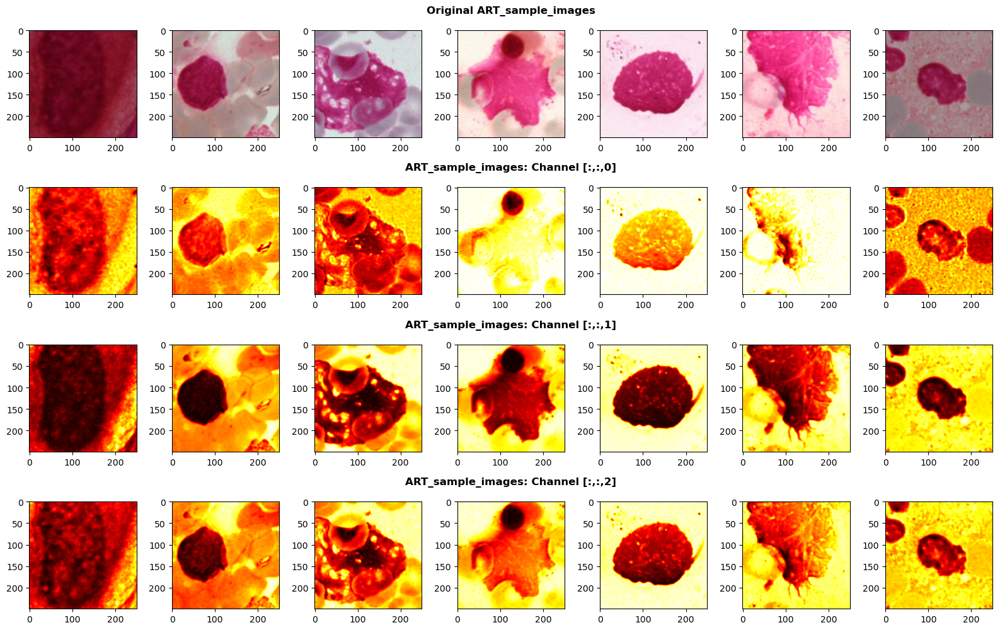

In [40]:
#ART sample images: original images compared to manipulated RGB channels
cmap = plt.cm.viridis
plt.set_cmap('hot')

fig, axs = plt.subplots(4, 7)
fig.set_size_inches(16, 10)

for i in range(7):
    axs[0][i].imshow(ART_sample_images[i]) #original
    axs[1][i].imshow(ART_sample_images[i][:,:,0])
    axs[2][i].imshow(ART_sample_images[i][:,:,1])
    axs[3][i].imshow(ART_sample_images[i][:,:,2])
    

create_subtitle(fig, grid[0, ::], 'Original ART_sample_images')
create_subtitle(fig, grid[1, ::], 'ART_sample_images: cmap=hot, Channel [:,:,0]')
create_subtitle(fig, grid[2, ::], 'ART_sample_images: cmap=hot, Channel [:,:,1]')
create_subtitle(fig, grid[3, ::], 'ART_sample_images: cmap=hot, Channel [:,:,2]')

plt.tight_layout(h_pad=2)

In [ ]:
#find distribution of RBG values
#increasing contrast?
#images are all same size
#a lot of the cells are centered with noise around
#maybe we can help NN by having progressive contrast reduction at the edges -- vignette?
#maybe figure out a way to mute surrounding cell data

#do some research on the different pathologies and what is important
#in the photos

### RGB Distribution

First I want to show the RBG distribution of a single pathology sample and then I will try to expand it to (possibly) averages of each pathology.

[[159 159 158 ... 161 159 158]
 [156 153 156 ... 156 158 155]
 [151 151 151 ... 151 153 151]
 ...
 [156 157 157 ... 161 163 165]
 [154 156 155 ... 160 163 163]
 [153 152 152 ... 162 162 164]]
[[142 142 144 ... 132 131 130]
 [139 138 142 ... 132 132 131]
 [135 136 138 ... 133 132 133]
 ...
 [141 139 137 ... 127 127 131]
 [138 138 134 ... 128 129 131]
 [137 136 131 ... 130 130 132]]
[[146 146 146 ... 135 131 130]
 [143 142 144 ... 134 132 131]
 [142 140 140 ... 134 134 134]
 ...
 [139 138 136 ... 137 139 142]
 [139 139 136 ... 139 140 142]
 [138 137 133 ... 141 141 143]]


Text(0, 0.5, 'Pixel count')

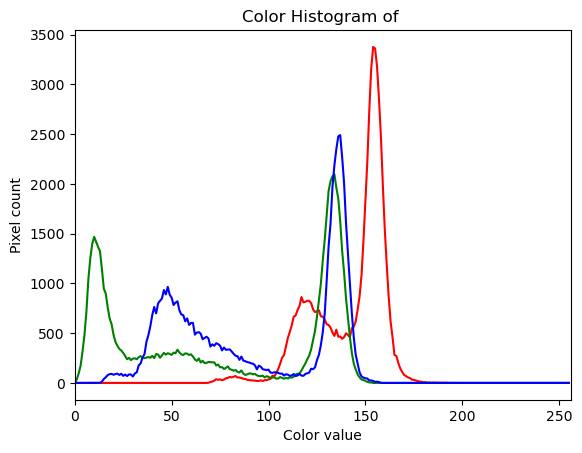

In [63]:
# tuple to select colors of each channel line
colors = ("red", "green", "blue")

#creating the histogram plot with RBG distribution
img = PMO_sample_images[3]
plt.figure()
plt.xlim([0, 256])
for channel_id, color in enumerate(colors):
    histogram, bin_edges = np.histogram(
        img[:, :, channel_id], bins=256, range=(0, 256)
    )
    print(img[:, :, channel_id])
    plt.plot(bin_edges[0:-1], histogram, color=color)

plt.title("Color Histogram of ")
plt.xlabel("Color value")
plt.ylabel("Pixel count")

Want to try and do something like for each pixel across every sample of a certain pathology, take the average RGB at that pixel and then create a histogram of the average RGB for that certain pathology.

Text(0, 0.5, 'Pixel count')

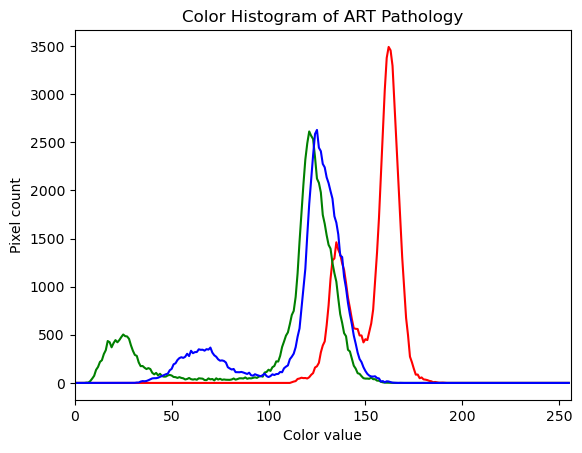

In [107]:
##THIS ISN'T CORRECT, NEED TO FIGURE OUT HOW TO AVG PER PIXEL

#tuple to select colors of each channel line
colors = ("red", "green", "blue")

#creating the histogram plot with RBG distribution for an entire pathology
collect = []

plt.figure()
plt.xlim([0, 256])
for channel_id, color in enumerate(colors):
    for image in ART_sample_images:
            samp = image[:, :, channel_id]
    histogram, bin_edges = np.histogram(
        samp, bins=256, range=(0, 256)
        )
    plt.plot(bin_edges[0:-1], histogram, color=color)

plt.title("Color Histogram of ART Pathology")
plt.xlabel("Color value")
plt.ylabel("Pixel count")